In [75]:
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib
from pymoo.problems import get_problem
from pymoo.util.ref_dirs import get_reference_directions
import torch
import numpy as np


def das_dennis_recursion(ref_dirs, ref_dir, n_partitions, beta, depth):
    if depth == len(ref_dir) - 1:
        ref_dir[depth] = beta / (1.0 * n_partitions)
        ref_dirs.append(ref_dir[None, :])
    else:
        for i in range(beta + 1):
            ref_dir[depth] = 1.0 * i / (1.0 * n_partitions)
            das_dennis_recursion(ref_dirs, np.copy(ref_dir), n_partitions, beta - i, depth + 1)

def das_dennis(n_partitions, n_dim):
    if n_partitions == 0:
        return np.full((1, n_dim), 1 / n_dim)
    else:
        ref_dirs = []
        ref_dir = np.full(n_dim, np.nan)
        das_dennis_recursion(ref_dirs, ref_dir, n_partitions, n_partitions, 0)
        return np.concatenate(ref_dirs, axis=0)

generated_pf1 = np.load('fig/dtlz1_im_all.npy')
generated_pf2 = np.load('fig/dtlz1_im_511.npy')
generated_pf3 = np.load('fig/dtlz1_im_151.npy')
generated_pf4 = np.load('fig/dtlz1_im_115.npy')


OV = np.load('fig/dtlz1_im_solutions.npy')

pref = das_dennis(30, 3)
fig = plt.figure(figsize=(25, 25))
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=100)
pf = get_problem('convex_dtlz4').pareto_front(ref_dirs=ref_dirs)
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
ax = fig.add_subplot(141, projection='3d')


ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.scatter(OV[:, 0], OV[:, 1], OV[:, 2], c='w', alpha=0.5, lw=1, s=45, label='training data', edgecolors='black')
Color = ['#ff595e', '#ffca3a', '#8ac926', '#1982c4', '#6a4c93']
for p in range(5):
    leg = f'Pref. :{round(0.2*p, 1)}~{round(0.2*(p+1), 1)}'
    pre_index = (0.2*p <= pref[:, 0]) & (pref[:, 0] <= 0.2*(p+1))
    # if p ==1:
    #     color = '#d6ce93'
    # else:
    #     color = palette(p)
    ax.scatter(generated_pf1[pre_index, 0], generated_pf1[pre_index, 1], generated_pf1[pre_index, 2],
                c=Color[p], alpha=1, lw=1, label=leg, s=35)

ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)
plt.tight_layout()
ax.view_init(elev=20., azim=30)

ax = fig.add_subplot(142, projection='3d')
ax.scatter(generated_pf2, generated_pf2, generated_pf2,
            c='blue', alpha=1, lw=1, label=leg, s=35)
ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)

plt.tight_layout()
ax.view_init(elev=20., azim=30)

ax = fig.add_subplot(143, projection='3d')
ax.scatter(generated_pf3, generated_pf3, generated_pf3,
            c='blue', alpha=1, lw=1, label=leg, s=35)
ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)

plt.tight_layout()
ax.view_init(elev=20., azim=30)

ax = fig.add_subplot(144, projection='3d')
ax.scatter(generated_pf4, generated_pf4, generated_pf4,
            c='blue', alpha=1, lw=1, label=leg, s=35)
ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)

plt.tight_layout()
ax.view_init(elev=20., azim=30)


# plt.savefig('fig/dtlz4_ls_1_1.png', dpi=400)
# ax.legend(loc='best', fontsize=14)
plt.show(block=True)

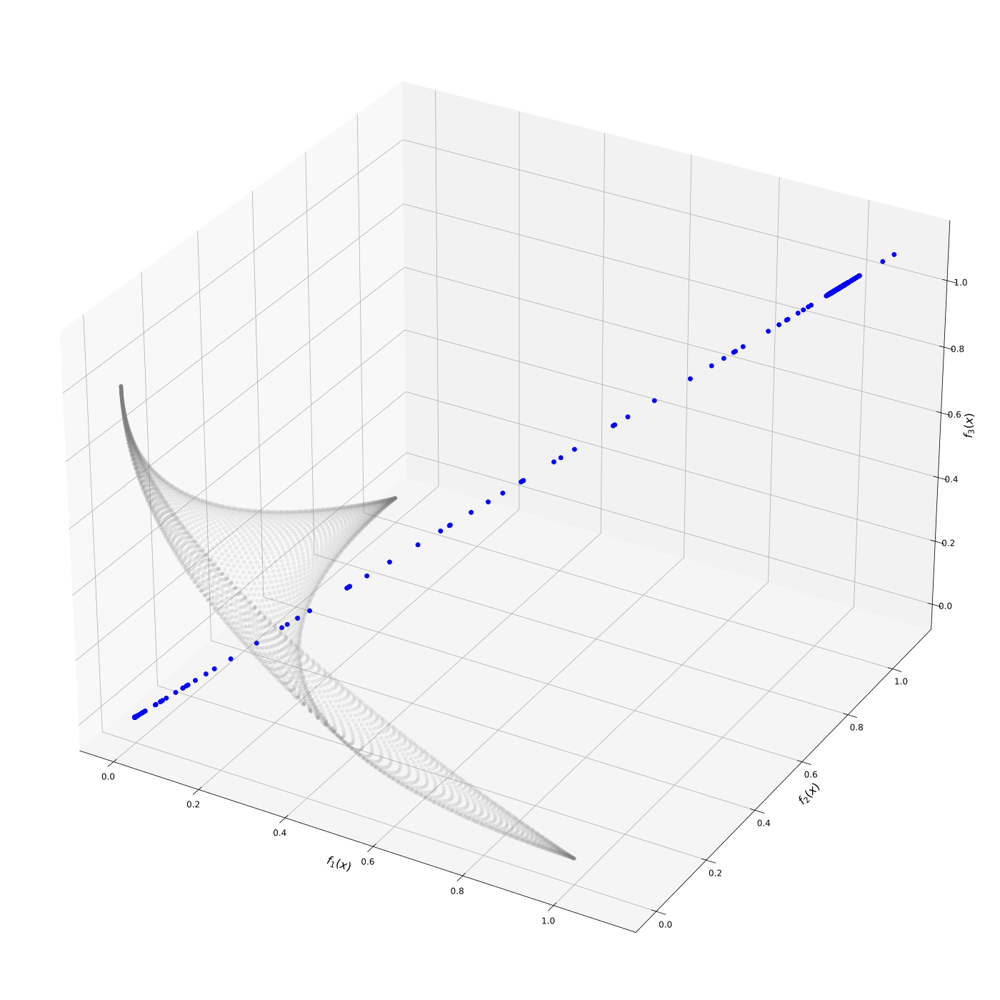

In [60]:
generated_pff1= np.load('fig/convex_fim_111.npy')
generated_pff2= np.load('fig/convex_fim_511.npy')
generated_pff3= np.load('fig/convex_fim_151.npy')
generated_pff4= np.load('fig/convex_fim_115.npy')
AOV = np.load('fig/convex_archive.npy')
# repair
fig = plt.figure(figsize=(25, 25))
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=100)
pf = get_problem('convex_dtlz4').pareto_front(ref_dirs=ref_dirs)
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
ax = fig.add_subplot(141, projection='3d')


ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.scatter(AOV[:, 0], AOV[:, 1], AOV[:, 2], c='w', alpha=0.5, lw=1, s=45, label='training data', edgecolors='black')
Color = ['#ff595e', '#ffca3a', '#8ac926', '#1982c4', '#6a4c93']
for p in range(5):
    leg = f'Pref. :{round(0.2*p, 1)}~{round(0.2*(p+1), 1)}'
    pre_index = (0.2*p <= pref[:, 0]) & (pref[:, 0] <= 0.2*(p+1))
    # if p ==1:
    #     color = '#d6ce93'
    # else:
    #     color = palette(p)
    ax.scatter(generated_pff1[pre_index, 0], generated_pff1[pre_index, 1], generated_pff1[pre_index, 2],
                c=Color[p], alpha=1, lw=1, label=leg, s=35)

ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)
plt.tight_layout()
ax.view_init(elev=20., azim=30)

ax = fig.add_subplot(142, projection='3d')
ax.scatter(generated_pff2, generated_pff2, generated_pff2,
            c='blue', alpha=1, lw=1, label=leg, s=35)
ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)

plt.tight_layout()
ax.view_init(elev=20., azim=30)

ax = fig.add_subplot(143, projection='3d')
ax.scatter(generated_pff3, generated_pff3, generated_pff3,
            c='blue', alpha=1, lw=1, label=leg, s=35)
ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)

plt.tight_layout()
ax.view_init(elev=20., azim=30)

ax = fig.add_subplot(144, projection='3d')
ax.scatter(generated_pff4, generated_pff4, generated_pff4,
            c='blue', alpha=1, lw=1, label=leg, s=35)
ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)

plt.tight_layout()
ax.view_init(elev=20., azim=30)

# plt.savefig('fig/dtlz4_ls_1_1.png', dpi=400)
# ax.legend(loc='best', fontsize=14)
plt.show(block=True)

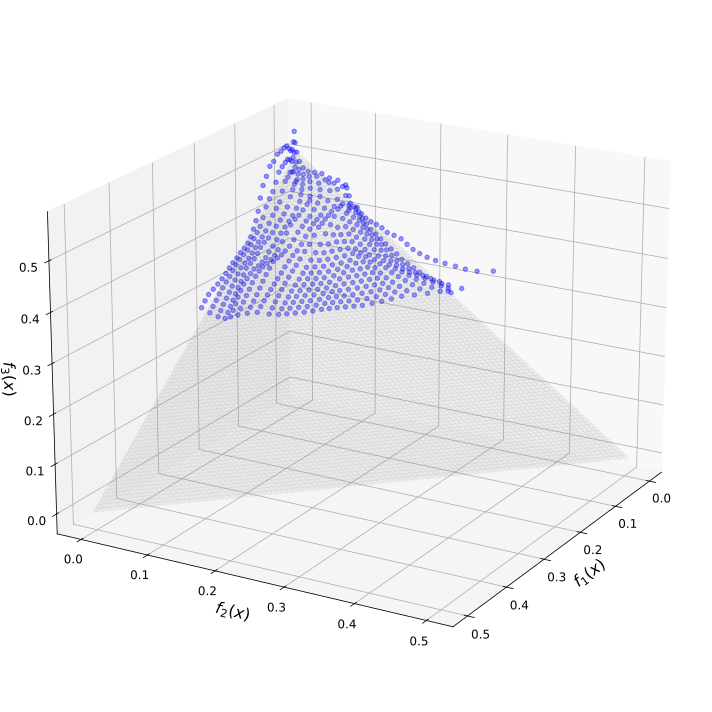

In [106]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
generated_pf= np.load('fig/dtlz1_im_115.npy')
ref_dirs = get_reference_directions("das-dennis", 3, n_partitions=100)
pf = get_problem('dtlz1').pareto_front(ref_dirs=ref_dirs)
ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')

ax.scatter(generated_pf[:, 0], generated_pf[:, 1], generated_pf[:, 2], c='blue', alpha=0.4, lw=1, label='Pareto front')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)
ax.view_init(elev=20., azim=30)
plt.tight_layout()
plt.show()

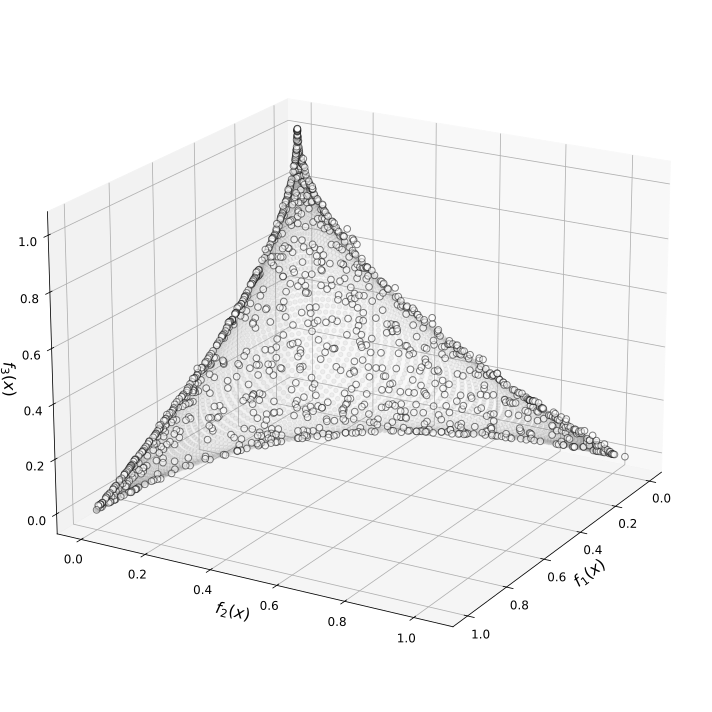

In [89]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
pf = get_problem('convex_dtlz4').pareto_front(ref_dirs=ref_dirs)
ax.scatter(AOV[:, 0], AOV[:, 1], AOV[:, 2], c='w', alpha=0.5, lw=1, s=45, label='training data', edgecolors='black')
# for p in range(5):
#     leg = f'Pref. :{round(0.2*p, 1)}~{round(0.2*(p+1), 1)}'
#     pre_index = (0.2*p <= pref[:, 0]) & (pref[:, 0] <= 0.2*(p+1))
#     # if p ==1:
#     #     color = '#d6ce93'
#     # else:
#     #     color = palette(p)
#     ax.scatter(generated_pff1[pre_index, 0], generated_pff1[pre_index, 1], generated_pff1[pre_index, 2],
#                 c=Color[p], alpha=1, lw=1, label=leg, s=35)
ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)
ax.view_init(elev=20., azim=30)
plt.tight_layout()
plt.show()

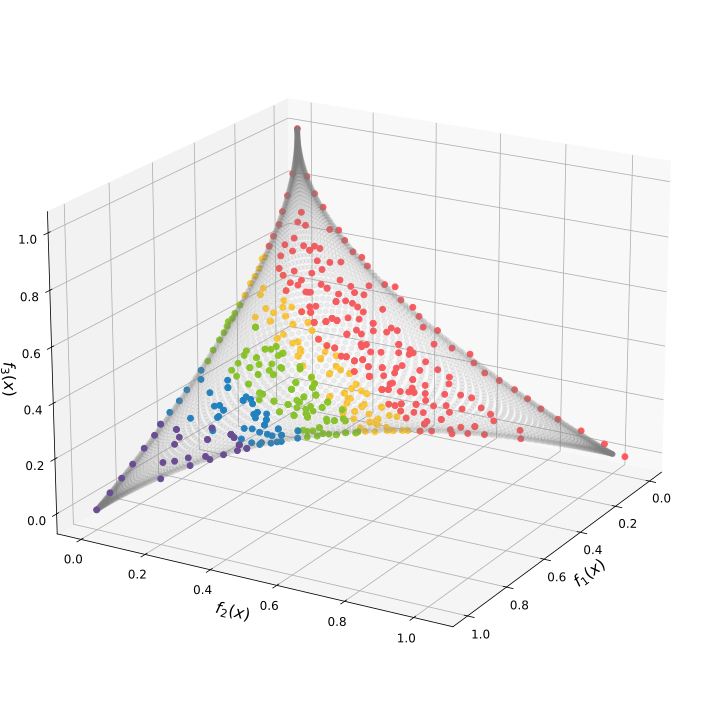

In [86]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
pf = get_problem('convex_dtlz4').pareto_front(ref_dirs=ref_dirs)
# ax.scatter(AOV[:, 0], AOV[:, 1], AOV[:, 2], c='w', alpha=0.5, lw=1, s=45, label='training data', edgecolors='black')
for p in range(5):
    leg = f'Pref. :{round(0.2*p, 1)}~{round(0.2*(p+1), 1)}'
    pre_index = (0.2*p <= pref[:, 0]) & (pref[:, 0] <= 0.2*(p+1))
    # if p ==1:
    #     color = '#d6ce93'
    # else:
    #     color = palette(p)
    ax.scatter(generated_pff1[pre_index, 0], generated_pff1[pre_index, 1], generated_pff1[pre_index, 2],
                c=Color[p], alpha=1, lw=1, label=leg, s=35)
ax.scatter(pf[:, 0], pf[:, 1], pf[:, 2], c='gray', alpha=0.1, lw=1, label='Pareto front')
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.tick_params(axis='z', labelsize=12)
ax.set_xlabel(r'$f_1(x)$', size=16)
ax.set_ylabel(r'$f_2(x)$', size=16)
ax.set_zlabel(r'$f_3(x)$', size=16)
ax.view_init(elev=20., azim=30)
plt.tight_layout()
plt.show()

In [118]:
get_reference_directions("das-dennis", 3, n_partitions=60).shape

(1891, 3)